In [23]:
using LinearAlgebra
using ITensors, ITensorMPS
using Plots

In [77]:
include("../src/states.jl")

include("../src/circuits.jl")
include("../src/defs.jl")
include("../src/dynamics.jl")
include("../src/observables.jl")
include("../src/measurements.jl")

forced_measure_with_val (generic function with 2 methods)

In [3]:
# full_data = Dict{Tuple{Int,Int,Float64,Float64},Dict}()

# exact vs sampled CMI

In [ ]:
L = 6
T = 3L
γ = 0.01
λ = 0.0

ψ0 = diagonal_neelstate(L)

ψ, data, terminal_data = circuit(ψ0, L, T, γ, λ; PBC=false, cutoff=1E-8, maxdim=200);

In [374]:
i = 3
CMI(ψ, 1:1, 2:i, i+1:6, 10000)

(0.06984840745687837, 12.25336516004727)

In [371]:
vector_CMI(to_vector(ψ.mps), 3)

0.06999051053962502 + 0.0im

In [51]:
function reduced(state::AbstractVector, sites::AbstractVector{Int})
    L = Int(log2(length(state)))

    sites = [L-site+1 for site in sites]  # Reverse order for ITensors.jl

    # Convert state vector to multidimensional array
    state_tensor = reshape(state, fill(2, L)...)
    
    # Get complement of sites
    other_sites = setdiff(1:L, sites)
    
    # Sum over all other sites
    result = dropdims(sum(state_tensor, dims=other_sites), dims=Tuple(other_sites))
    
    # Convert back to vector
    return vec(result)
end


reduced (generic function with 1 method)

In [63]:
ψ, sites = MPS_neelstate(10)

s = sites[1]
plus = ITensor([1, 1], s)
contract(plus, ψ[1])

ITensor ord=1 (dim=1|id=466|"Link,l=1")
NDTensors.Dense{Float64, Vector{Float64}}

In [92]:
function reduce(state::DiagonalState, i::Int, j::Int)
    ψ = state.mps
    sites = siteinds(ψ)

    left = ITensor([1, 1], sites[1]) * ψ[1]
    for pos in 2:i-1
        left = left * ITensor([1, 1], sites[pos]) * ψ[pos]
    end

    right = ITensor([1, 1], sites[end]) * ψ[end]
    for pos in length(sites)-1:-1:j+1
        right = right * ITensor([1, 1], sites[pos]) * ψ[pos]
    end

    return to_vector(left * contract(ψ[i:j]) * right)
end


reduce (generic function with 1 method)

In [93]:
state = diagonal_neelstate(6)
ψ = reduce(state, 3, 4)

4-element Vector{ComplexF64}:
                0.0 + 0.0im
 1.0000000000000004 + 0.0im
                0.0 + 0.0im
                0.0 + 0.0im

In [88]:
ψ, sites = MPS_neelstate(10)
i = 3
j = 6
left = ITensor([1, 1], sites[1]) * ψ[1]
for pos in 2:i-1
    left = left * ITensor([1, 1], sites[pos]) * ψ[pos]
end

right = ITensor([1, 1], sites[end]) * ψ[end]
for pos in length(sites)-1:-1:j+1
    right = right * ITensor([1, 1], sites[pos]) * ψ[pos]
end

In [89]:
right

ITensor ord=1 (dim=1|id=375|"Link,l=6")
NDTensors.Dense{Float64, Vector{Float64}}

In [71]:
contract(ψ[3:6])

ITensor ord=6 (dim=1|id=125|"Link,l=2") (dim=2|id=328|"Qubit,Site,n=3") (dim=2|id=568|"Qubit,Site,n=4") (dim=2|id=481|"Qubit,Site,n=5") (dim=2|id=383|"Qubit,Site,n=6") (dim=1|id=385|"Link,l=6")
NDTensors.Dense{Float64, Vector{Float64}}

In [ ]:
function contract_ABC(ψ::MPS, A::Vector{Int}, B::Vector{Int}, C::Vector{Int})
    # Get all sites
    N = length(ψ)
    ρ = contract(ρ)
    all_sites = collect(1:N)
    
    # Get sites to contract with <+|
    contract_sites = setdiff(all_sites, vcat(A, B, C))
    
    # Create a copy of the MPS to work with
    ρ = deepcopy(ψ)
    
    # Contract with <+| on specified sites
    for i in contract_sites
        s = siteind(ρ, i)
        plus = ITensor([1/sqrt(2), 1/sqrt(2)], s)
        ρ = contract(plus, ρ, i)
    end
    
    # Contract remaining tensors
    result = reduce(*, ρ)
    
    return result
end

In [21]:
marginalize([1; 0; 0; 0; 0; 0; 1; 0]/2, [3])

2-element Vector{Float64}:
 0.5
 0.5

In [55]:
sites = siteinds("Qubit", 3)
ψ = MPS(sites, _ -> "0")
ψ = apply(op("H",sites[1]), ψ)
ψ = apply(op("CNOT",sites[1],sites[2]), ψ)
ψ /= norm(DiagonalState(ψ))

MPS
[1] ((dim=2|id=413|"Qubit,Site,n=1"), (dim=2|id=700|"Link,l=1"))
[2] ((dim=2|id=700|"Link,l=1"), (dim=2|id=728|"Qubit,Site,n=2"), (dim=1|id=383|"Link,l=2"))
[3] ((dim=2|id=861|"Qubit,Site,n=3"), (dim=1|id=383|"Link,l=2"))


In [53]:
entanglemententropy(ψ; bond=1)

0.9999999999999999

In [58]:
reduced(to_vector(ψ),[3])

2-element Vector{ComplexF64}:
 1.0000000000000002 + 0.0im
                0.0 + 0.0im

In [44]:
to_vector(ψ)

8-element Vector{ComplexF64}:
 0.5000000000000001 + 0.0im
                0.0 + 0.0im
                0.0 + 0.0im
                0.0 + 0.0im
                0.0 + 0.0im
                0.0 + 0.0im
 0.5000000000000001 + 0.0im
                0.0 + 0.0im

# Exact CMI sims

In [11]:
L = 30
T = 10L
γ = 0.1
λ = 0.1

ψ0 = diagonal_neelstate(L)

ψ, data, terminal_data = circuit(ψ0, L, T, γ, λ; observables=Symbol[], PBC=false, cutoff=1E-8, maxdim=200);
# full_data[(L,T,γ,λ)] = data

(DiagonalState(MPS
[1] ((dim=2|id=582|"Qubit,Site,n=1"), (dim=2|id=77|"Link,l=1"))
[2] ((dim=2|id=785|"Qubit,Site,n=2"), (dim=4|id=861|"Link,l=2"), (dim=2|id=77|"Link,l=1"))
[3] ((dim=2|id=421|"Qubit,Site,n=3"), (dim=8|id=975|"Link,l=3"), (dim=4|id=861|"Link,l=2"))
[4] ((dim=2|id=79|"Qubit,Site,n=4"), (dim=11|id=209|"Link,l=4"), (dim=8|id=975|"Link,l=3"))
[5] ((dim=2|id=191|"Qubit,Site,n=5"), (dim=14|id=514|"Link,l=5"), (dim=11|id=209|"Link,l=4"))
[6] ((dim=2|id=125|"Qubit,Site,n=6"), (dim=18|id=238|"Link,l=6"), (dim=14|id=514|"Link,l=5"))
[7] ((dim=2|id=948|"Qubit,Site,n=7"), (dim=21|id=950|"Link,l=7"), (dim=18|id=238|"Link,l=6"))
[8] ((dim=2|id=406|"Qubit,Site,n=8"), (dim=23|id=972|"Link,l=8"), (dim=21|id=950|"Link,l=7"))
[9] ((dim=2|id=342|"Qubit,Site,n=9"), (dim=21|id=345|"Link,l=9"), (dim=23|id=972|"Link,l=8"))
[10] ((dim=2|id=845|"Qubit,Site,n=10"), (dim=19|id=532|"Link,l=10"), (dim=21|id=345|"Link,l=9"))
[11] ((dim=2|id=959|"Qubit,Site,n=11"), (dim=21|id=391|"Link,l=11"), (dim=1

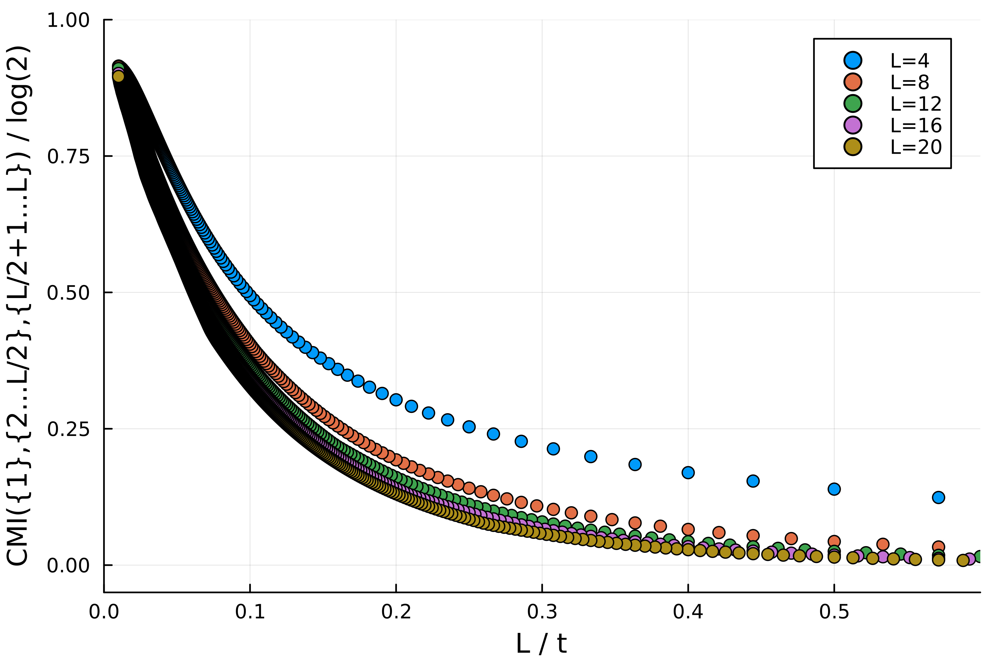

In [ ]:
γ = 0.01
λ = 0.0
plt = plot()
for L in [8,12,16,20]
    T = 100L
    xs = collect(0:T)
    ys = full_data[(L,T,γ,λ)][:exact_mid_CMI][1:2:end] / log(2)
    plt = plot!(plt, L ./ xs[1:1:end], ys[1:1:end], seriestype=:scatter, label="L=$L", legend=:topright)
end
plt = plot!(plt, xlabel="L / t", ylabel="CMI({1},{2...L/2},{L/2+1...L}) / log(2)", dpi=600, ylim=(-0.05,1), xlim=(0,0.6))
# savefig(plt, "../figs/25_09_21/CMI_vs_L_t.png")
plt

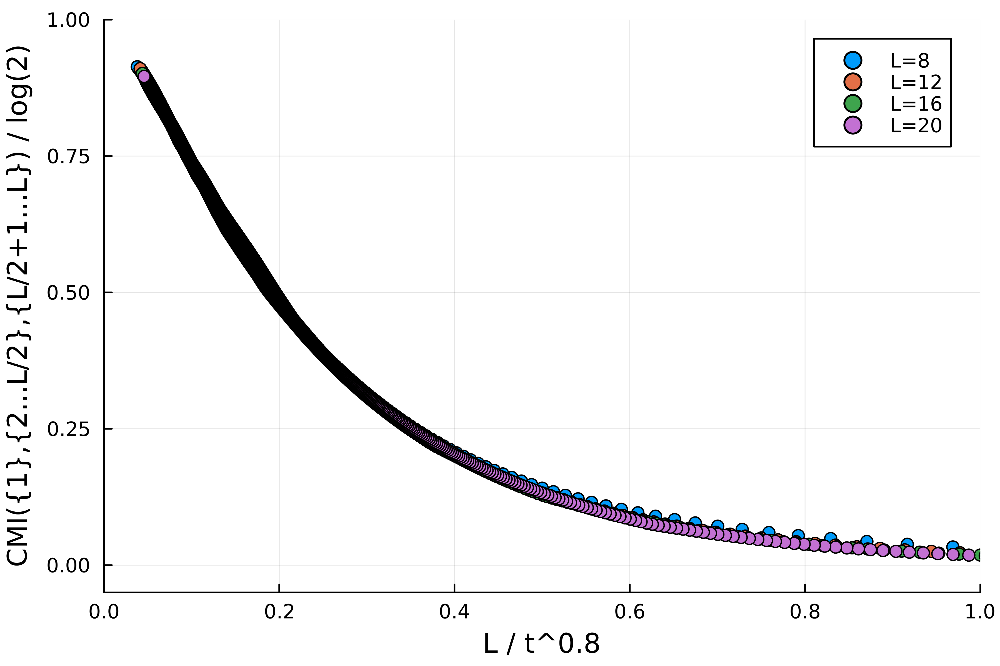

In [ ]:
γ = 0.01
λ = 0.0
plt = plot()
for L in [8,12,16,20]
    T = 100L
    xs = collect(0:T) .^ 0.8
    ys = full_data[(L,T,γ,λ)][:exact_mid_CMI][1:2:end] / log(2)
    plt = plot!(plt, L ./ xs[1:1:end], ys[1:1:end], seriestype=:scatter, label="L=$L", legend=:topright)
end
plt = plot!(plt, xlabel="L / t^0.8", ylabel="CMI({1},{2...L/2},{L/2+1...L}) / log(2)", dpi=600, ylim=(-0.05,1), xlim=(0,1))
# savefig(plt, "../figs/25_09_21/CMI_vs_L_t_0.8.png")
plt

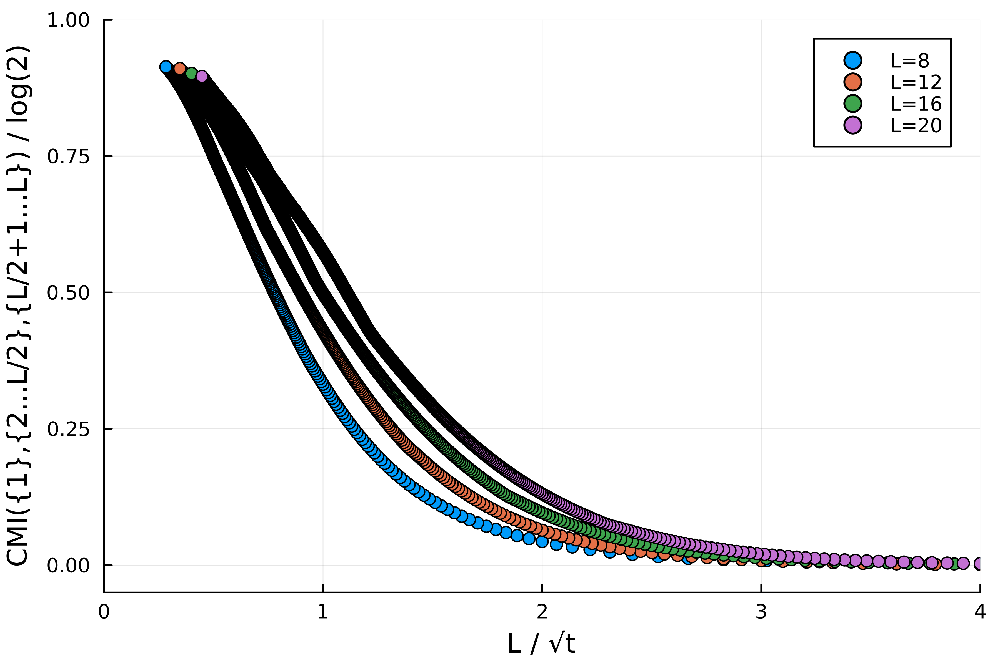

In [ ]:
γ = 0.01
λ = 0.0
plt = plot()
for L in [8,12,16,20]
    T = 100L
    xs = collect(0:T) .^ 0.5
    ys = full_data[(L,T,γ,λ)][:exact_mid_CMI][1:2:end] / log(2)
    plt = plot!(plt, L ./ xs[1:1:end], ys[1:1:end], seriestype=:scatter, label="L=$L", legend=:topright)
end
plt = plot!(plt, xlabel="L / √t", ylabel="CMI({1},{2...L/2},{L/2+1...L}) / log(2)", dpi=600, ylim=(-0.05,1), xlim=(0,4))
# savefig(plt, "../figs/25_09_21/CMI_vs_L_sqrt_t.png")
plt

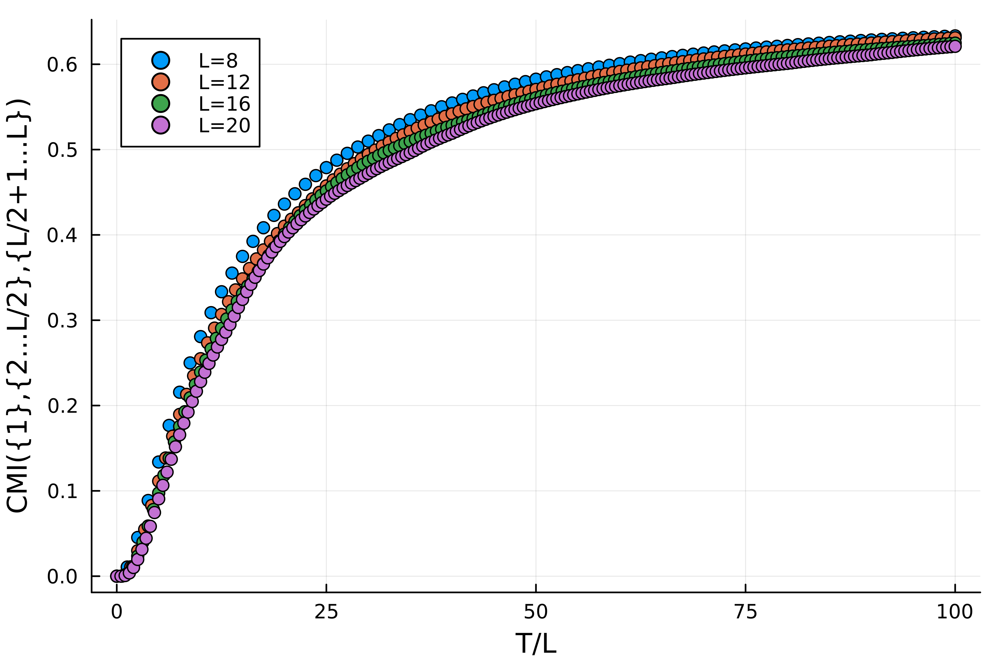

In [ ]:
γ = 0.01
λ = 0.0
plt = plot()
for L in [8,12,16,20]
    T = 100L
    xs = collect(0:T)/L
    ys = full_data[(L,T,γ,λ)][:exact_mid_CMI][1:2:end]
    plt = plot!(plt, xs[1:10:end], ys[1:10:end], seriestype=:scatter, label="L=$L", legend=:topleft)
end
plt = plot!(plt, xlabel="T/L", ylabel="CMI({1},{2...L/2},{L/2+1...L})", dpi=600)
# savefig(plt, "../figs/25_09_21/CMI_vs_time.png")
plt

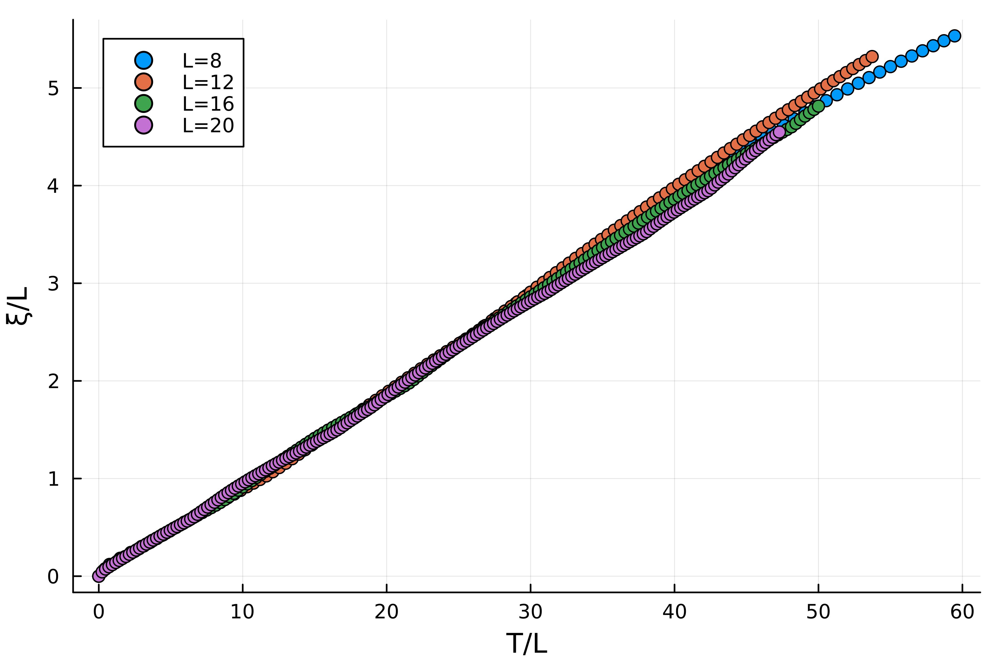

In [ ]:
γ = 0.01
λ = 0.0
plt = plot()
for L in [8,12,16,20]
    T = 100L
    xs = collect(0:T)/L^
    ys = - L÷2 ./ log.(full_data[(L,T,γ,λ)][:exact_mid_CMI][1:2:end]/log(2))
    plt = plot!(plt, xs[1:10:end], ys[1:10:end]/L, seriestype=:scatter, label="L=$L", legend=:topleft)
end
plt = plot!(plt, xlabel="T/L", ylabel="ξ/L", dpi=600)
# savefig(plt, "../figs/25_09_21/markov_length_vs_time.png")
plt

# scratchwork

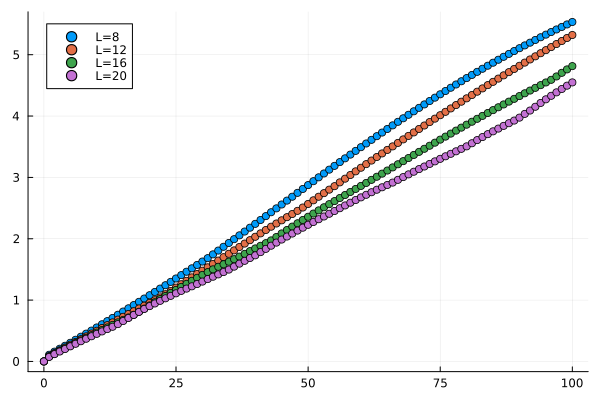

In [404]:
γ = 0.01
λ = 0.0
plt = plot()
for L in [8,12,16,20]
    T = 100L
    xs = collect(0:T)/L
    ys = - L÷2 ./ log.(full_data[(L,T,γ,λ)][:exact_mid_CMI][1:2:end]/log(2))
    plt = plot!(plt, xs[1:L:T÷1+1], ys[1:L:T÷1+1]/L, seriestype=:scatter, label="L=$L", legend=:topleft)
end
plt

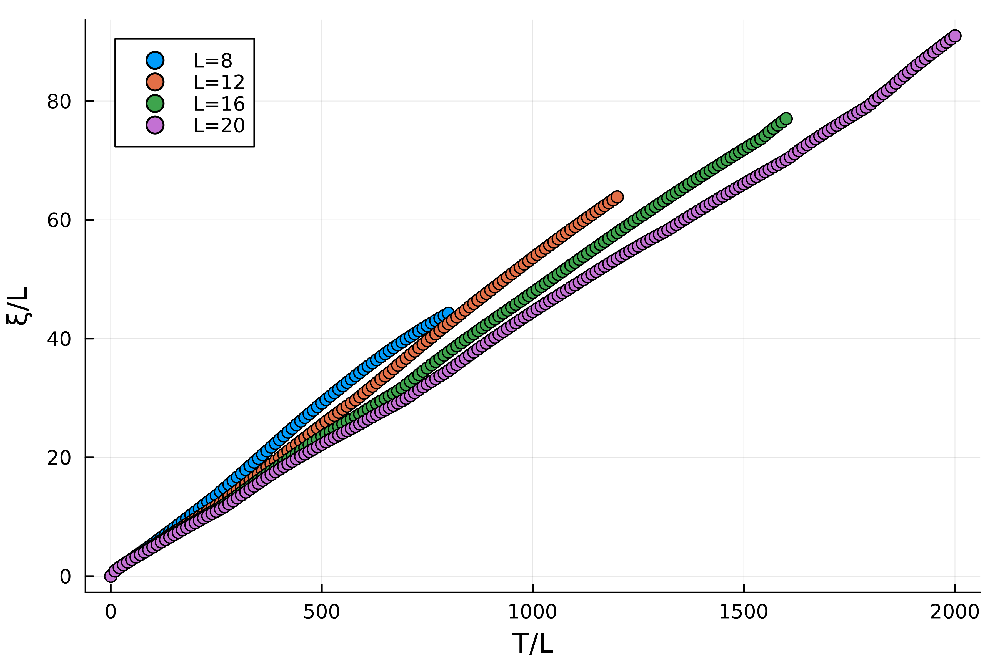

In [ ]:
γ = 0.01
λ = 0.0
plt = plot()
for L in [8,12,16,20]
    T = 100L
    xs = collect(0:T)
    ys = - L÷2 ./ log.(full_data[(L,T,γ,λ)][:exact_mid_CMI][1:2:end]/log(2))
    plt = plot!(plt, xs[1:10:end], ys[1:10:end], seriestype=:scatter, label="L=$L", legend=:topleft)
end
plt = plot!(plt, xlabel="T/L", ylabel="ξ/L", dpi=600)
# savefig(plt, "../figs/25_09_21/markov_length_vs_time.png")
plt

In [229]:
function vector_CMI(ρ::AbstractVector, i::Int)
    A = 1
    B = i-1
    C = Int(log2(length(ρ))) - i
    SABC = sum([real(val) > 0.0 ? -val * log(val) : 0.0 for val in ρ])
    ρAB = sum([ρ[i:2^C:end] for i in 1:2^C])
    ρB = ρAB[1:2^B] + ρAB[2^B+1:2^(B+1)]
    ρBC = ρ[1:2^(B+C)] + ρ[2^(B+C)+1:2^(B+C+1)]

    SAB = sum([real(val) > 0.0 ? -val * log(val) : 0.0 for val in ρAB])
    SBC = sum([real(val) > 0.0 ? -val * log(val) : 0.0 for val in ρBC])
    SB = sum([real(val) > 0.0 ? -val * log(val) : 0.0 for val in ρB])
    return SAB + SBC - SB - SABC
end

vector_CMI (generic function with 1 method)

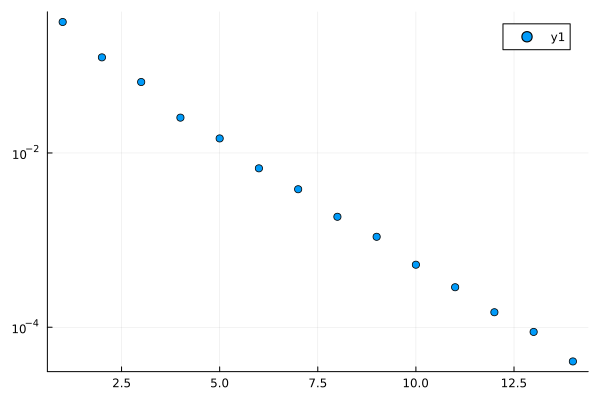

In [283]:
L = 16
ξs = zeros(Float64, 10L)
for T in 1:10L

# T = 12
    γ = 0.1
    λ = 0.0

    ψ0 = diagonal_neelstate(L)

    ψ, data = circuit(ψ0, L, T, γ, λ; observables=Symbol[], PBC=false, cutoff=1E-8, maxdim=200);
    ρ = to_vector(ψ.mps);

    plot(1:L-2, real.([vector_CMI(ρ, i) for i in 2:L-1])/log(2), seriestype=:scatter, yscale=:log10)

   ξs[T] = -(L÷2) / log2(vector_CMI(ρ, L÷2))
end

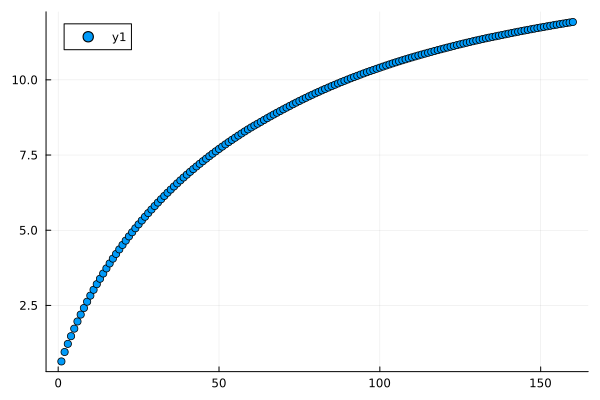

In [285]:
plot(collect(1:10L), ξs, seriestype=:scatter)

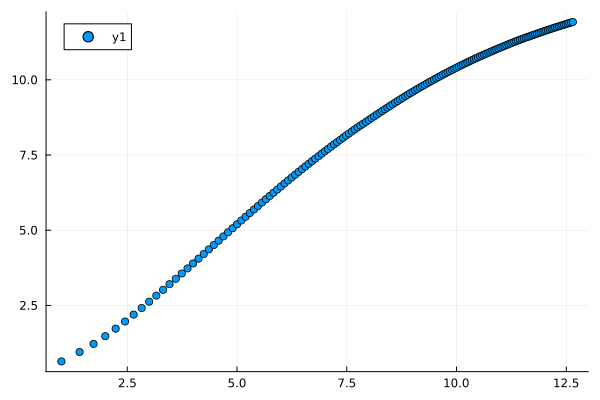

In [284]:
plot(sqrt.(collect(1:10L)), ξs, seriestype=:scatter)

In [218]:
length(ρ)

16

In [ ]:
SABC = sum([real(val) > 0.0 ? -val * log(val) : 0.0 for val in ρ])

In [199]:
samples = 1000
CMIs = zeros(L-2)
for i in 2:L-1
    CMIs[i-1], _ = CMI(ψ, 1:1, 2:i, i+1:L, samples)
end

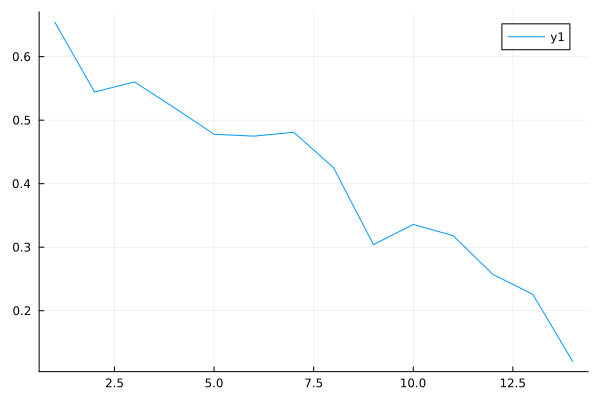

In [200]:
plot(CMIs)

In [157]:
CMI(ψ, 1:1, 2:3, 4:4, 1000)

(-0.09290664765805978, 7.868674854365162)

In [159]:
ρ = to_vector(ψ.mps)

16-element Vector{ComplexF64}:
  -9.380407061145873e-17 + 0.0im
  1.7555506540790687e-16 + 0.0im
  -1.449062641765484e-16 + 0.0im
      0.2194610690377543 + 0.0im
  -8.094091809166122e-17 + 0.0im
      0.2548084572465431 + 0.0im
      0.1886942782391038 + 0.0im
   7.306609411411688e-17 + 0.0im
 -1.4464864791972076e-16 + 0.0im
     0.18869427823910473 + 0.0im
     0.10802229233756004 + 0.0im
   2.386877701722226e-17 + 0.0im
    0.040319624899934604 + 0.0im
  1.3524368591072663e-16 + 0.0im
 -3.3365072650220196e-18 + 0.0im
  1.1797307229220695e-16 + 0.0im

In [177]:
SABC = sum([real(val) > 0.0 ? -val * log(val) : 0.0 for val in ρ])

1.6804165697117706 + 0.0im

In [167]:
entropy(ψ, 1:4, 1000)

(1.6814757439154333, 0.1568195520445026)

In [ ]:
ρA = [sum(ρ[1:8]), sum(ρ[9:16])]
SA = sum([real(val) > 0.0 ? -val * log(val) : 0.0 for val in ρA])

0.6390500032200267 + 0.0im

In [170]:
entropy(ψ, 1:1, 1000)

(0.6227887943161118, 0.09841816837434825)

In [187]:
ρB = ρ[1:2:end] + ρ[2:2:end]
ρB = ρB[1:4] + ρB[5:8]
SB = sum([real(val) > 0.0 ? -val * log(val) : 0.0 for val in ρB])

1.355077310754258 + 0.0im

In [172]:
entropy(ψ, 2:3, 1000)

(1.3557131644681426, 0.060804841125613907)

In [ ]:
ρC = [sum(ρ[1:2:end]), sum(ρ[2:2:end])]
SC = sum([real(val) > 0.0 ? -val * log(val) : 0.0 for val in ρC])

0.6390500032200257 + 0.0im

In [176]:
entropy(ψ, 4:4, 1000)

(0.6383489858262158, 0.10211312339611456)

In [178]:
ρAB = ρ[1:2:end] + ρ[2:2:end]
SAB = sum([real(val) > 0.0 ? -val * log(val) : 0.0 for val in ρAB])

1.6804165697117592 + 0.0im

In [182]:
entropy(ψ, 1:3, 1000)

(1.6414360839920281, 0.11025404825129437)

In [183]:
ρBC = ρ[1:8] + ρ[9:16]
SBC = sum([real(val) > 0.0 ? -val * log(val) : 0.0 for val in ρBC])

1.6804165697117586 + 0.0im

In [185]:
entropy(ψ, 2:4, 1000)

(1.659900035526471, 0.13539113726552454)

In [188]:
SAB + SBC - SB - SABC

0.32533925895748905 + 0.0im

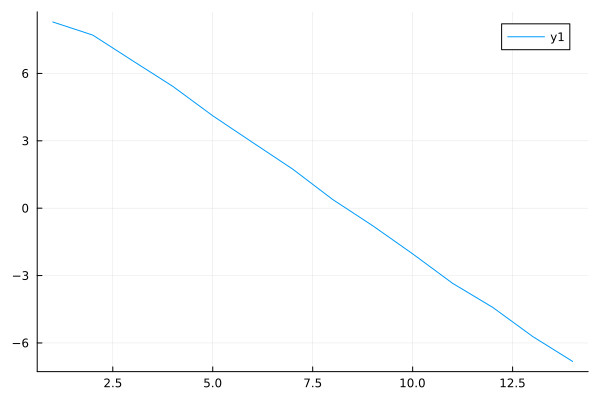

In [138]:
plot(CMIs)

In [121]:
CMI(ψ, 1:1, 2:10, 11:L, 1000)

(0.9370979511152875, 297.03274792034756)

In [122]:
CMI(ψ, 1:1, 2:10, 11:L, 1000)

(0.9407602382493643, 297.5501630936072)

In [123]:
CMI(ψ, 1:1, 2:6, 6:L, 1000)

(6.2680455980463545, 343.599623227038)

In [124]:
CMI(ψ, 1:1, 2:6, 6:L, 1000)

(6.344848526924416, 346.28299486991864)

In [110]:
entropy(ψ, 1:L, 100)

(18.461045842987716, 343.4317739087253)

In [105]:
entropy(ψ, 2:10, 100)

(5.647295739276589, 32.538523350166905)

In [103]:
entropy(ψ, 1:10, 100)

(5.940882810545433, 36.22073935461114)

In [104]:
entropy(ψ, 2:L, 100)

(17.741034381204596, 317.841192870647)

In [106]:
17.741034381204596 + 5.940882810545433 - 17.78855464490932 - 5.647295739276589

0.24606680756412036

In [78]:
ψ = diagonal_neelstate(1)

DiagonalState(MPS
[1] ((dim=2|id=543|"Qubit,Site,n=1"),)
)

In [79]:
ψ2 = deepcopy(ψ)

DiagonalState(MPS
[1] ((dim=2|id=543|"Qubit,Site,n=1"),)
)

In [83]:
expect(ψ.mps, "Z")

1-element Vector{Float64}:
 -1.0

In [84]:
expect(ψ2.mps, "Z")

1-element Vector{Float64}:
 -1.0

In [82]:
ψ3 = measure(ψ2, [0 1; 1 0], 1.0, 1, false; cutoff=1E-8, maxdim=200)

DiagonalState(MPS
[1] ((dim=2|id=543|"Qubit,Site,n=1"),)
)

In [85]:
expect(ψ3.mps, "Z")

1-element Vector{Float64}:
 0.0